# 20240122_SKNY_library_test

In [8]:
# load library
import stlearn as st
#import scanpy as sc
#import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import cv2
import pandas as pd
import scipy.stats
import seaborn as sns
import plotly.express as px
from PIL import Image
import networkx as nx
import math

## sk.pp.distance_calculator()

### Function

In [845]:
def cv2pil(image):
    ''' OpenCV type -> PIL type '''
    new_image = image.copy()
    if new_image.ndim == 2: 
        pass
    elif new_image.shape[2] == 3: 
        new_image = cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB)
    elif new_image.shape[2] == 4: 
        new_image = cv2.cvtColor(new_image, cv2.COLOR_BGRA2RGBA)
    new_image = Image.fromarray(new_image)
    return new_image
    
# set the colormap and centre the colorbar
import matplotlib.colors as colors
class MidpointNormalize(colors.Normalize):
	"""
	Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

	e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
	"""
	def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
		self.midpoint = midpoint
		colors.Normalize.__init__(self, vmin, vmax, clip)

	def __call__(self, value, clip=None):
		# I'm ignoring masked values and all kinds of edge cases to make a
		# simple example...
		x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
		return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))

def calculate_distance(grid, pos_marker_ls, neg_marker_ls=None):
    '''
    grid : AnnData
    pos_marker_ls, neg_marker_ls: list
    '''

    ## get col and row length data from grid object --------------------------
    N_ROW = len(grid.uns["grid_yedges"]) - 1
    N_COL = len(grid.uns["grid_xedges"]) - 1
    
    ## Difine positive grid ---------------------------
    pos_series = sum([ grid.to_df()[i] for i in pos_marker_ls])
    pos_series = pd.Series([1 if i>=1 else 0 for i in pos_series], index=pos_series.index)
    
    # distract negative grid
    if neg_marker_ls != None:
        neg_series = sum([ grid.to_df()[i] for i in neg_marker_ls])
        neg_series = pd.Series([1 if i>=1 else 0 for i in neg_series], index=neg_series.index)
        pos_series = pos_series - neg_series
        pos_series = pd.Series([-1 if i==0 else i for i in pos_series], index=pos_series.index)
    
    else:
        pos_series = pd.Series([-1 if i==0 else i for i in pos_series], index=pos_series.index)
    
    # expand information of all grid
    pos_series.name = "tumor_grid"
    df_grid_tumor = pd.merge(
        pd.DataFrame(index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)]), 
        pos_series, right_index=True, left_index=True, how="left"
    ).fillna(-1)


    ## Generate data of positive grid---------------------------
    fig, ax = plt.subplots(figsize=(N_COL, N_ROW), dpi=1, tight_layout=True)
    cmap = matplotlib.cm.viridis
    cmap.set_bad('black',1.)
    cmap.set_under(color='black') 
    ax.imshow(
        np.array(df_grid_tumor["tumor_grid"]).reshape(N_COL, N_ROW).T, cmap=cmap,
        vmin=0,
        vmax=1,
    )
    ax.axis('off')
    # convert from fig to numpy
    fig.canvas.draw()
    img = np.array(fig.canvas.renderer.buffer_rgba())
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2BGR)
    plt.close()
    grid.uns["marker"] = img.copy() # add to grid object

    
    ## Median filter---------------------------
    #img = cv2.cvtColor(img, cv2.COLOR_RGBA2BGR)
    img_med = cv2.medianBlur(img, ksize=3)
    grid.uns["marker_median"] = img_med.copy() # add to grid object

    
    ## Delineation --------------------------------
    threshold = 90 # threshold
    # convert glay scale and blur
    img_gray = cv2.cvtColor(img_med, cv2.COLOR_BGR2GRAY)
    img_blur = cv2.blur(img_gray, (3,3))
    # delineation
    ret, img_binary = cv2.threshold(img_blur, threshold, 255, cv2.THRESH_BINARY)
    contours, hierarchy = cv2.findContours(img_binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    contours_ = []
    # check each delineation
    for i, s in zip(contours, hierarchy[0]):
        # select top of hierarchy polygon
        #if s[-1] == -1:
        contours_ += [i]
    
    img_color_with_contours = cv2.drawContours(img_med, contours_, -1, (0,255,0), 1)
    grid.uns["marker_delineation"] = img_color_with_contours # add to grid object


    ## Converting image data to graph stracture ---------------------------------
    # OpenCV -> PIL
    image = cv2pil(img_color_with_contours)

    # extract size
    width, height = image.size
    # generate graph
    graph = nx.Graph()
    
    tumor_contour_pixel_ls = []
    tumor_pixel_ls = []
    edge_pixel_ls = []
    # ピクセルをノードに変換
    for y in range(height):
        for x in range(width):
            pixel_value = image.getpixel((x, y))
            graph.add_node((x, y), color=pixel_value)
    
            # extract tumor coutour coordination
            if pixel_value == (0, 255, 0):
                tumor_contour_pixel_ls += [(x, y)]
    
            # extract tumor coordination
            elif pixel_value == (253, 231, 36):
            #elif pixel_value == (255, 255, 0):

                tumor_pixel_ls += [(x, y)]
    
            if (y == 0) | (y == height-1) | (x == 0) | (x == width-1):
                edge_pixel_ls += [(x, y)]
    
    # get nodes
    nodes_ls = graph.nodes
    nodes_ls = list(nodes_ls)
    
    # check node inside contour
    inside_contour_ls = []
    for node in nodes_ls:
        for i in contours_:
            if cv2.pointPolygonTest(i, node, False) == 1:
                inside_contour_ls += [node]
                break
    
    # extract tumor inside contour
    tumor_pixel_ls = [i for i in tumor_pixel_ls if i in inside_contour_ls]
    
    # extract non-tumor inside contour
    #nontumor_pixel_inside_contour_ls = [i for i in inside_contour_ls if i not in tumor_pixel_ls]
    
    # 隣接ピクセル間にエッジを作成
    for y in range(height):
        for x in range(width):
            current_node = (x, y)
            neighbors = [
                (x, y - 1),  # 上
                (x, y + 1),  # 下
                (x - 1, y),  # 左
                (x + 1, y)   # 右
            ]
            # 上下左右のエッジ
            for neighbor in neighbors:
                if neighbor in graph.nodes:
                    graph.add_edge(current_node, neighbor)
    
            # 斜めのエッジ
            if (y != height) & (x != width):
                node1 = (x, y)
                node2 = (x + 1, y + 1)
    
                # ノードの座標からユークリッド距離を計算
                distance = math.sqrt((node1[0] - node2[0])**2 + (node1[1] - node2[1])**2)
                graph.add_edge(node1, node2, weight=distance)
    
                node1 = (x + 1, y)
                node2 = (x, y + 1)
    
                # ノードの座標からユークリッド距離を計算
                distance = math.sqrt((node1[0] - node2[0])**2 + (node1[1] - node2[1])**2)
                graph.add_edge(node1, node2, weight=distance)
    
    
    #remove non-tumor inside contour from graph
    #graph.remove_nodes_from(nontumor_pixel_inside_contour_ls)
    
    # delete contour at the edge of image 
    tumor_edge_contour_pixel_ls = list(set(tumor_contour_pixel_ls) & set(edge_pixel_ls))
    
    tumor_pixel_ls = list(
        set(tumor_pixel_ls) | (set(tumor_contour_pixel_ls) & set(edge_pixel_ls))
    )
    
    tumor_contour_pixel_ls = list(
        set(tumor_contour_pixel_ls) - (set(tumor_contour_pixel_ls) & set(edge_pixel_ls))
    )

    #tumor_contour_pixel_ls = [i for i in tumor_contour_pixel_ls if i in list(graph.nodes)]
    
    ## Calculate distance of each nodes from tumor surface ---------------------------------------------------
    shortest_paths = nx.multi_source_dijkstra(graph, tumor_contour_pixel_ls, cutoff=16, weight="weight")
    
    # shotest length from contour
    df_shotest = pd.DataFrame.from_dict(shortest_paths[0], orient="index", columns=["euclidean"])
    
    # negative value for inside contour
    df_shotest.loc[df_shotest.index[df_shotest.index.isin(tumor_pixel_ls)]] = df_shotest.loc[df_shotest.index[df_shotest.index.isin(tumor_pixel_ls)]] * -1
    df_shotest["euclidean_round"] = df_shotest["euclidean"].round(0)
    df_nodes = pd.DataFrame(index=nodes_ls)
    
    df_shotest = pd.merge(
        df_nodes, df_shotest, right_index=True, left_index=True, how="left"
    ).fillna(np.nan)

    # debag
    #return grid
    
    ## Color scale of distance from surface ------------------------
    #fig, ax = plt.subplots(figsize=(N_COL, N_ROW), dpi=1, tight_layout=True)
    #cmap = matplotlib.cm.Spectral
    #cmap.set_bad('black',1.)
    #cmap.set_under(color='black') 
    #elev_min=df_shotest["euclidean"].min()
    #elev_max=df_shotest["euclidean"].max()
    #mid_val=0
    
    #ax.imshow(
    #    np.array(df_shotest["euclidean"]).reshape(N_ROW, N_COL), cmap=cmap, 
    #    clim=(elev_min, elev_max), norm=MidpointNormalize(midpoint=mid_val,vmin=elev_min, vmax=elev_max)
    #)
    #ax.axis('off')
    
    # convert from fig to numpy
    fig.canvas.draw()
    img = np.array(fig.canvas.renderer.buffer_rgba())
    plt.close()
    grid.uns["shotest"] = img # add to grid object

    ## Delineation ----------------------------------
    col_ls = []
    for i in df_shotest["euclidean_round"]:
        if i == 0:
            col_ls += [(0, 255, 0)]
        elif i < 0:
            col_ls += [(0, 255, 255)]
        else:
            col_ls += [(0, 0, 0)]
    
    col_arr = np.array(col_ls, dtype=np.uint8).reshape(N_ROW, N_COL, 3)
    grid.uns["marker_median_delineation"] = col_arr.copy() # add to grid object

    ## Delineation with 30μm interval -------------
    col_ls = []
    for i in df_shotest["euclidean_round"]:
        if i == 0:
            col_ls += [(0, 255, 0)]
        elif (i % 3 == 0) & (i > 0):
            col_ls += [(0, 0, 255)]
        elif (i % 3 == 0) & (i < 0):
            col_ls += [(0, 150, 255)]
        elif i < 0:
            col_ls += [(0, 255, 255)]
        else:
            col_ls += [(0, 0, 0)]
    
    col_arr = np.array(col_ls, dtype=np.uint8).reshape(N_ROW, N_COL, 3)
    grid.uns["shotest_30_delineation"] = col_arr.copy() # add to grid object

    ## Discretization ---------------------------------
    df_shotest["region"] = pd.cut(
        df_shotest.dropna()["euclidean"], 
        bins=list(range(-15, 16, 3))
    )
    
    for i in df_shotest.dropna().region.value_counts()[df_shotest.dropna().region.value_counts() > 100].sort_index().index:
            
        col_ls = []
        for s in df_shotest["region"]:
            if s == i:
                col_ls += [(255, 255, 255)]
            else:
                col_ls += [(0, 0, 0)]
        
        col_arr = np.array(col_ls, dtype=np.uint8).reshape(N_ROW, N_COL, 3)
        grid.uns[f"shotest_region_{i}_delineation"] = col_arr # add to grid object
    
    # annotation of dataframe of shortest distance from surface
    grid.uns["shortest"] = df_shotest

    return grid

### Test

In [875]:
xenium_path = "/Volumes/Project/home/sakai/CODEX/data/breast_sample"

In [876]:
# test
adata = st.ReadXenium(feature_cell_matrix_file=f"{xenium_path}/cell_feature_matrix.h5",
                     cell_summary_file=f"{xenium_path}/cells.csv.gz",
                     library_id="XXX",
                     image_path=None,
                     scale=1,
                     spot_diameter_fullres=10
                     )

# Gridding at 10μm interval
N_COL = int((adata.obs.imagecol.max() - adata.obs.imagecol.min()) / 10)
N_ROW = int((adata.obs.imagerow.max() - adata.obs.imagerow.min()) / 10)

# Gridding
grid = st.tl.cci.grid(adata, n_row=N_ROW, n_col=N_COL, n_cpus=48, verbose=False)

In [877]:
grid = calculate_distance(
    grid, pos_marker_ls=['CDH1'], 
)

## sk.pl.preprocessed_images()

### Function

In [9]:
# subplot
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import cv2


def preprocessed_images(
    grid, figsize=(1000, 1000)
):
    '''
    grid: AnnData
    figsize: tupple
    '''

    # Load data -----------------------------
    df_shotest = grid.uns["shortest"]
    
    # list 
    image_ls = [
        "marker", 
        "marker_median", 
        "marker_median_delineation", 
        "shotest_30_delineation"
    ]
    
    image_ls += [f"shotest_region_{i}_delineation" for i in df_shotest.dropna().region.value_counts()[df_shotest.dropna().region.value_counts() > 100].sort_index().index]

    image_name_tp = ("Tumor", "Median filter", "Delineation", "Equidistant curves"
    ) + tuple([str(i * 10) for i in df_shotest.dropna().region.value_counts()[df_shotest.dropna().region.value_counts() > 100].sort_index().index])

    # Plot --------------------------------------
    fig = make_subplots(
        rows=math.ceil(len(image_name_tp) / 4), cols=4, vertical_spacing=0.05, horizontal_spacing=0.02, shared_yaxes='all',shared_xaxes='all',
        row_heights=[0.5] * math.ceil(len(image_name_tp) / 4), 
        column_widths=[0.5, 0.5, 0.5, 0.5], #vertical_spacing=0.02
        subplot_titles=image_name_tp, 
        x_title='X-axis',
        y_title='Y-axis',
    
    )
    
    for e, i in enumerate(image_ls):
        result_image = grid.uns[i]
        result_image = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)
    
        px.imshow(result_image)
        fig.add_trace(
            px.imshow(
                result_image,
            ).data[0],
            row=int(e/4)+1, col=e%4+1
        )
        
    fig.update_layout(height=figsize[0], width=figsize[1],
                      dragmode='pan', 
                      title_text="Preprocessed images")
    
    fig.show(config = {
        'scrollZoom': True,
        'toImageButtonOptions': {
            'format': 'png', # one of png, svg, jpeg, webp
            'filename': 'preprocessed_images',
            'height': figsize[0],
            'width': figsize[1],
            'scale': 3 } # Multiply title/legend/axis/canvas sizes by this factor
    })
    
    #fig.write_html("merge_image.html", config = {
    #    'scrollZoom': True,
    #})





### Test

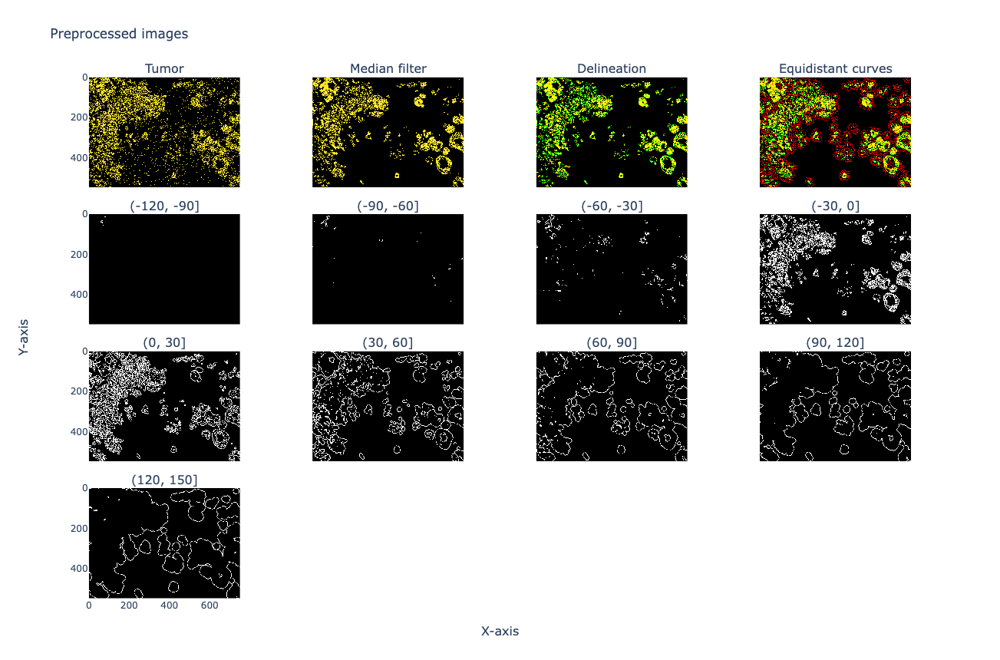

In [10]:
preprocessed_images(grid, figsize=(860, 1000))

## sk.pl.equidistant_curves()

### Function

In [11]:
# subplot
import plotly.express as px
import cv2


def equidistant_curves(
    grid, figsize=(1000, 1000)
):

    data = grid.uns["shotest_30_delineation"]
    
    fig = make_subplots()
    fig.add_trace(
        px.imshow(
            cv2.cvtColor(data, cv2.COLOR_BGR2RGB)
        ).data[0]
    )
    fig.update_layout(height=figsize[0], width=figsize[1],
                      dragmode='pan', 
                      title_text="Equidistant curves")
    
    fig.show(config = {
        'scrollZoom': True,
        'toImageButtonOptions': {
            'format': 'png', # one of png, svg, jpeg, webp
            'filename': 'preprocessed_images',
            'height': figsize[0],
            'width': figsize[1],
            'scale': 3 } # Multiply title/legend/axis/canvas sizes by this factor
    })

### Test

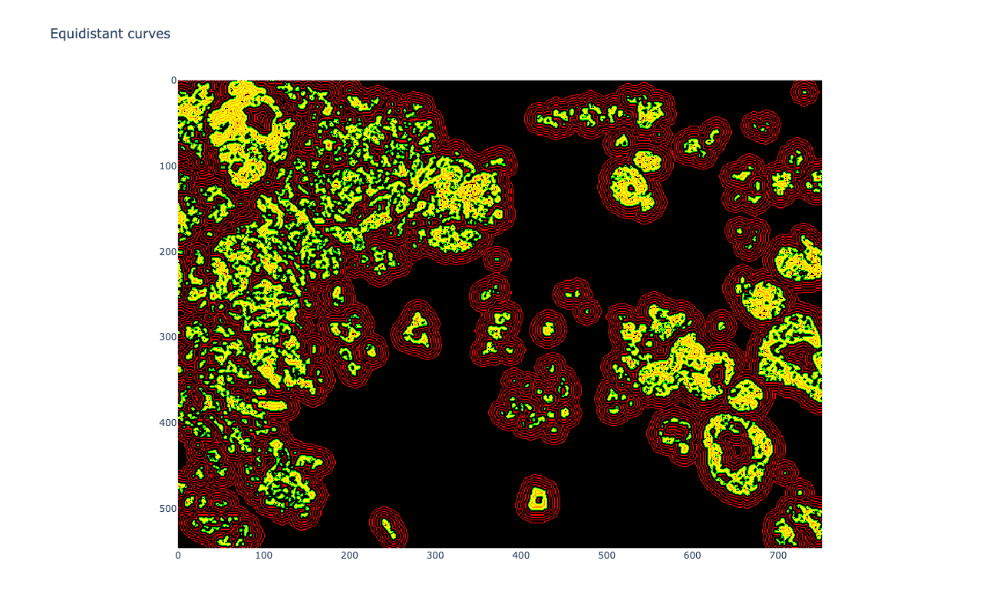

In [12]:
equidistant_curves(grid, figsize=(800, 1000))

## sk.pl.clustering_heatmap()

### Function

In [971]:
import plotly.graph_objects as go
import plotly
import pandas as pd
import seaborn as sns


def clustering_heatmap(
    grid, x_range=None, y_range=None, std=True, # min_grids=100
):
    '''
    grid : AnnData
    x_range, y_range: list
    std: bool
    min_grids: int
    '''
    ## get col and row length data from grid object --------------------------
    N_ROW = len(grid.uns["grid_yedges"]) - 1
    N_COL = len(grid.uns["grid_xedges"]) - 1

    # define variable which is name of table of gene expression by region--------------
    # if roi is selected
    if (x_range != None) | (y_range != None):
        name = "gene_expresion_by_region" \
        + "_x_["+", ".join([str(i) for i in x_range]) + "]" \
        + "_y_["+", ".join([str(i) for i in y_range]) + "]"
    else:
        name = "gene_expresion_by_region"

    # If it has already been calculated -----------------------------------------------
    if name in grid.uns.keys():
        df_grid_region_gene = grid.uns[name]
    else:
        
        ## Merge shortest path and count of gene -------------------------------------
        df_shotest = grid.uns["shortest"]
        df_grid = grid.to_df()
        
        # complement nan grid
        df_grid = pd.merge(
            pd.DataFrame(index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)]), 
            df_grid, right_index=True, left_index=True, how="left"
        ).fillna(np.nan)
        
        df_region = pd.DataFrame(
            np.array(df_shotest["region"]).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
            index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["region"]
        )

        ## ROI selection -------------------------------------------------
        if (x_range != None) | (y_range != None):
            df_roi = pd.DataFrame(
                np.array(df_shotest.index).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
                index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["region"]
            )
            roi_grids = df_roi[df_roi["region"].isin(
                [i for i in df_roi.region if (x_range[0] <= i[0] <= x_range[1]) & (y_range[0] <= i[1] <= y_range[1])]
            )].index
            # extract ROI
            df_region = df_region.loc[roi_grids, :]
            df_grid = df_grid.loc[roi_grids, :]
        
        df_grid_region = pd.merge(
            df_grid, df_region, 
            right_index=True, left_index=True, how="left"
        )
        
        df_grid_region = df_grid_region.dropna()
        df_grid_region_gene = df_grid_region.groupby("region").mean().T
        region_ls = df_grid_region.dropna().region.value_counts()[df_grid_region.dropna().region.value_counts() > 100].index
        df_grid_region_gene = df_grid_region_gene.loc[:,region_ls]
        df_grid_region_gene.columns = [i * 10 for i in df_grid_region_gene.columns]
        df_grid_region_gene = df_grid_region_gene.T.sort_index().T
    
        ## Save in uns----------------------------------------------------------------
        grid.uns[name] = df_grid_region_gene
    
    
    # Clustering ---------------------------------------------------------------
    # delete zero expression gene
    df_grid_region_gene = df_grid_region_gene[df_grid_region_gene.sum(axis=1) != 0]
    
    # if standardizing
    if std:
        df_grid_region_gene = df_grid_region_gene.apply(lambda x: scipy.stats.zscore(x), axis=1)
    
    g = sns.clustermap(
        df_grid_region_gene, 
        figsize=(8, 12), cmap="viridis", col_cluster=False, method="ward"
    )
    ax = g.ax_heatmap
    ax.set_ylabel("")
    plt.close() # not show
    # extract order of clustering
    row_order = g.dendrogram_row.reordered_ind
    #df_grid_region_gene = df_grid_region_gene.apply(lambda x: scipy.stats.zscore(x), axis=1).iloc[row_order, :]
    df_grid_region_gene = df_grid_region_gene.iloc[row_order, :] # reorder by clustering

    ## Plotly code ----------------------------------------------------------------
    hover_text = []
    for e1, i in enumerate(df_grid_region_gene.columns):
        temp_ls = []
        for e2, gene in enumerate(df_grid_region_gene.index):
            temp_ls += [
                f"""{gene} {i}<br> 
    Mean density={(df_grid_region_gene.iloc[e2, e1] / (10 * 10)).round(3)}/μm<sup>2</sup><br> 
    Z-score={df_grid_region_gene.iloc[e2, e1].round(3)}"""
            ]
        hover_text += [temp_ls]
    hover_text = np.array(hover_text).T
    
    # restriction of horizontal zoom
    layout = go.Layout(
        xaxis=dict(
            fixedrange=True
        )
    )
    
    x_col = [int(float(i.split(", ")[0][1:])) for i in df_grid_region_gene.columns.astype(str)] +\
    [int(float(df_grid_region_gene.columns.astype(str)[-1].split(", ")[1][:-1]))]
    
    fig = go.Figure(
        data=go.Heatmap(
            z=df_grid_region_gene, 
            x=x_col,
            y=df_grid_region_gene.index,
            colorscale = 'Viridis', 
            hoverinfo="text",  # ホバー時にテキストを表示
            text=hover_text,  # ホバーテキストを指定, 
        ), layout=layout, 
    )
    fig.update_xaxes(
        tickvals=x_col,  # 表示する位置のインデックス
        ticktext=x_col  # ラベルのリスト
    )
    fig.update_layout(title='Clustering based on transcript density of each region')
    fig.update_layout(xaxis=dict(title='Region'),height=800,)# width=800, height=1000,)
    fig.show()

    #plotly.io.write_html(fig, "grid_region_gene_std.html")

### Test

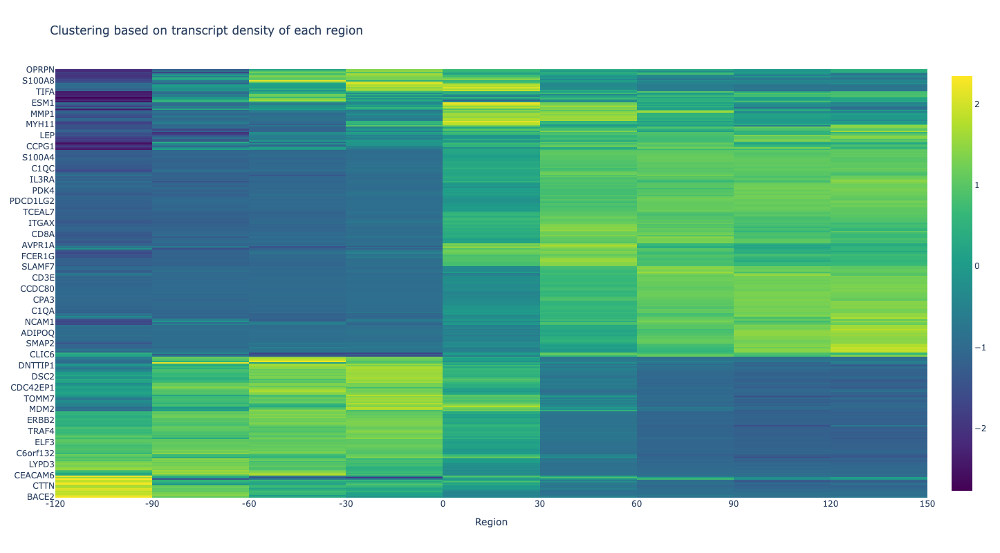

In [972]:
clustering_heatmap(grid, std=True)

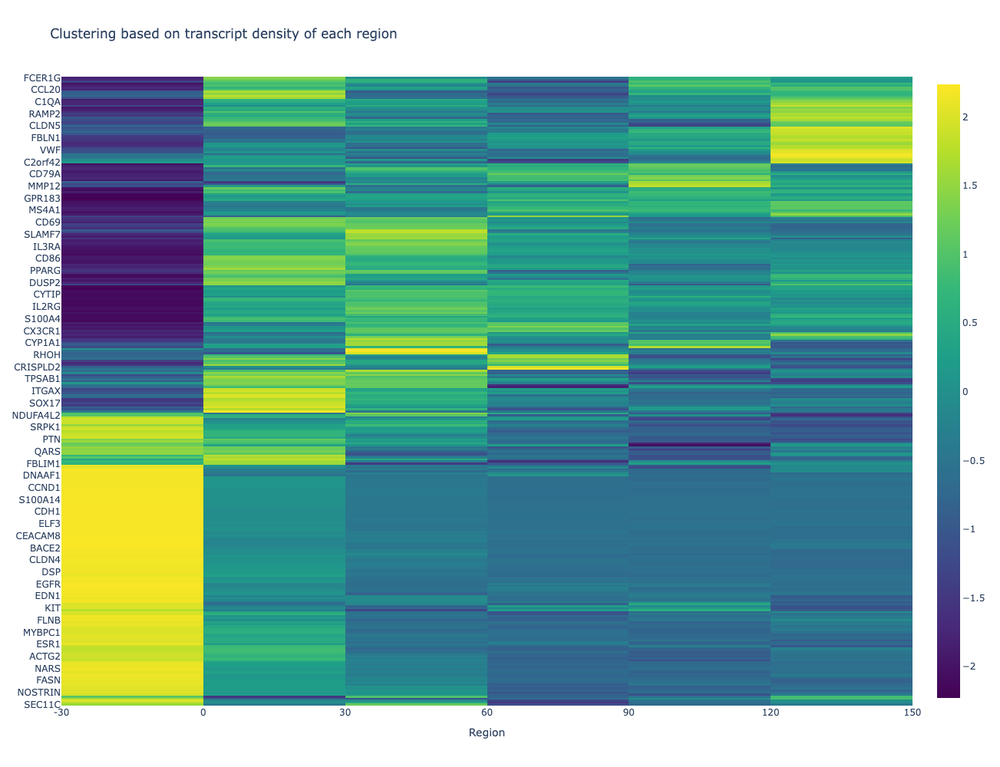

In [17]:
clustering_heatmap(grid, x_range=[380, 460], y_range=[25, 105], std=True)

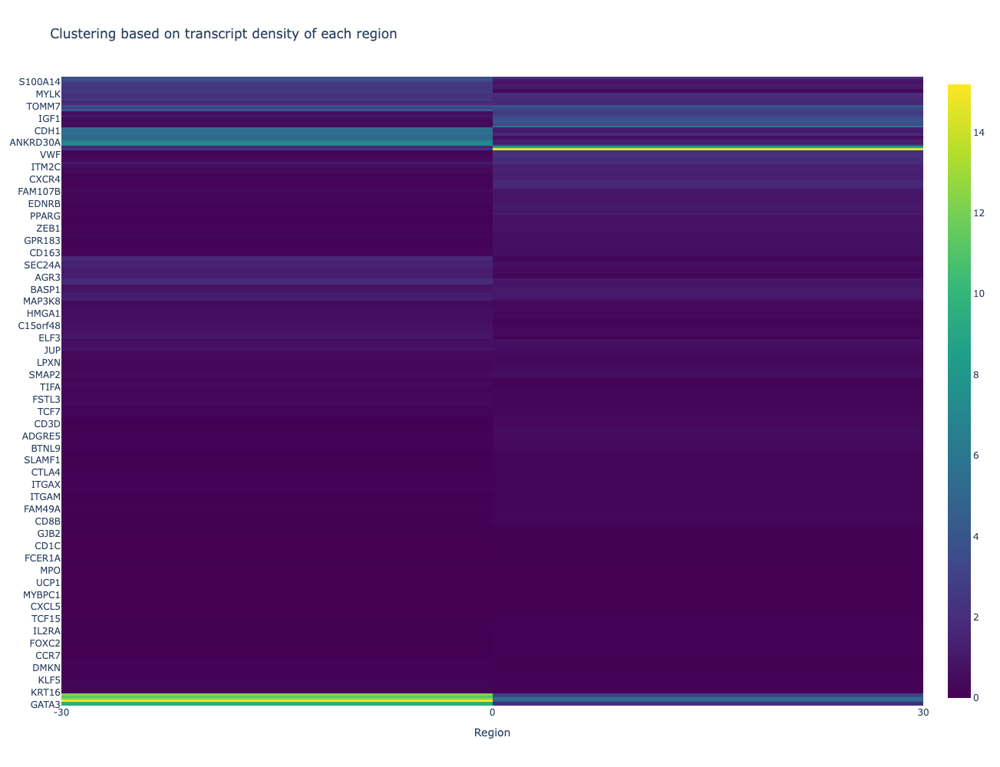

In [18]:
clustering_heatmap(grid,  x_range=[380, 460], y_range=[460, 520], std=False)

## sk.pl.distance_gene_plot()

- 遺伝子で絞りたい
- ROIで絞りたい
- Z-scoreにするかを選択にしたい

### Function

In [19]:
import plotly.graph_objects as go
import plotly
import pandas as pd
import seaborn as sns


def distance_gene_plot(
    grid, gene_symbol, 
    x_range=None, y_range=None, std=False, show=True, #min_grids=100
):
    '''
    grid: AnnData
    gene: str
    x_range, y_range: list
    std: bool
    min_grids: int
    '''
    ## get col and row length data from grid object --------------------------
    N_ROW = len(grid.uns["grid_yedges"]) - 1
    N_COL = len(grid.uns["grid_xedges"]) - 1

    # define variable which is name of table of gene expression by region--------------
    # if roi is selected
    if (x_range != None) | (y_range != None):
        name = "gene_expresion_by_region" \
        + "_x_["+", ".join([str(i) for i in x_range]) + "]" \
        + "_y_["+", ".join([str(i) for i in y_range]) + "]"
    else:
        name = "gene_expresion_by_region"

    # If it has already been calculated -----------------------------------------------
    if name in grid.uns.keys():
        df_grid_region_gene = grid.uns[name]
    else:
    
        ## Load shortest path and gene expression -------------------------------------
        df_shotest = grid.uns["shortest"]
        df_grid = grid.to_df()
        
        # complement nan grid
        df_grid = pd.merge(
            pd.DataFrame(index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)]), 
            df_grid, right_index=True, left_index=True, how="left"
        ).fillna(np.nan)
        
        df_region = pd.DataFrame(
            np.array(df_shotest["region"]).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
            index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["region"]
        )
    
        ## ROI selection -------------------------------------------------
        if (x_range != None) | (y_range != None):
            df_roi = pd.DataFrame(
                np.array(df_shotest.index).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
                index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["region"]
            )
            roi_grids = df_roi[df_roi["region"].isin(
                [i for i in df_roi.region if (x_range[0] <= i[0] <= x_range[1]) & (y_range[0] <= i[1] <= y_range[1])]
            )].index
            # extract ROI
            df_region = df_region.loc[roi_grids, :]
            df_grid = df_grid.loc[roi_grids, :]
    
        ## Merge shortest table and expression table --------------------------
        df_grid_region = pd.merge(
            df_grid, df_region, 
            right_index=True, left_index=True, how="left"
        )
        # Shaping
        df_grid_region = df_grid_region.dropna()
        df_grid_region_gene = df_grid_region.groupby("region").mean().T
        region_ls = df_region.region.value_counts()[df_region.region.value_counts() > 100].index # min grids
        df_grid_region_gene = df_grid_region_gene.loc[:,region_ls]
        df_grid_region_gene.columns = [i * 10 for i in df_grid_region_gene.columns]
        df_grid_region_gene = df_grid_region_gene.T.sort_index().T

        ## Save in uns----------------------------------------------------------------
        grid.uns[name] = df_grid_region_gene
    
    ## Histgram ------------------------------------------------------------
    # When standardizing for each gene
    if std:
        df_grid_region_gene = df_grid_region_gene.apply(lambda x: scipy.stats.zscore(x), axis=1)
        
    df_dist_gene = pd.DataFrame(df_grid_region_gene.loc[gene_symbol, :])
    df_dist_gene.index = [str(i) for i in df_dist_gene.index]
    fig = px.bar(
        df_dist_gene,
        y=gene_symbol,
    )

    # When standardizing for each gene
    if std:
        fig.update_layout(xaxis=dict(title='Region'),
                         yaxis=dict(title=f'{gene_symbol} (z-score)'))
        fig.update_layout(title=f'Z-score of {gene_symbol} expession of each region')
        
    else:
        fig.update_layout(xaxis=dict(title='Region'),
                         yaxis=dict(title=f'{gene_symbol}/μm<sup>2</sup>'))
        fig.update_layout(title=f'Density of {gene_symbol} expession of each region')
        
    fig.update_layout(plot_bgcolor="white")
    
    #plotly.io.write_html(fig, "QC_cxcl9_barplot.html")
    if show:
        fig.show()

### Test

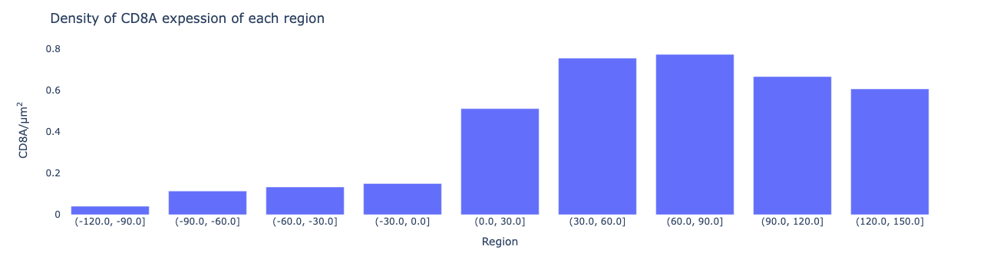

In [20]:
distance_gene_plot(grid, gene_symbol="CD8A")

In [21]:
distance_gene_plot(grid, gene_symbol="CD8A", show=False)

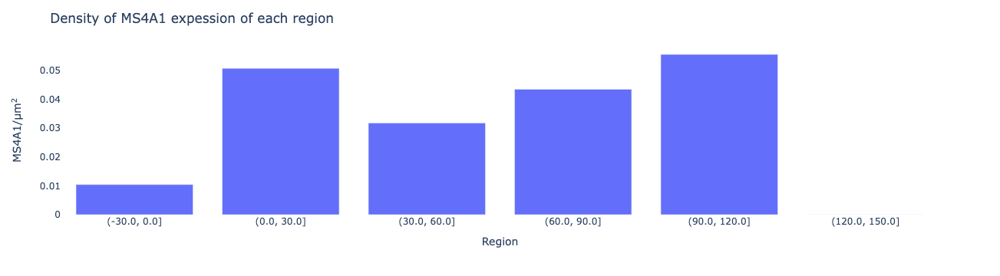

In [23]:
# triple positive DCIS
distance_gene_plot(
    grid, "MS4A1", x_range=[380, 460], y_range=[460, 520], 
)

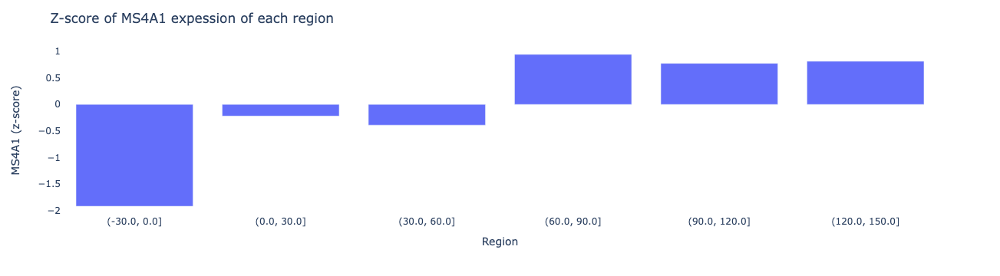

In [24]:
# HER2 DCIS
distance_gene_plot(
    grid, "MS4A1", x_range=[380, 460], y_range=[25, 105], std=True
)

### Advanced tutorial

In [916]:
triple_positive_dcis_roi = [380, 460], [460, 520]
erbb_dcis_roi = [380, 460], [25, 105]
erbb_esr_dcis_roi = [620, 700], [200, 280]
invasive_roi = [320, 400], [120, 200]
neoplasia_roi = [240, 320], [250, 330]

roi_ls = [
    neoplasia_roi, 
    erbb_esr_dcis_roi, triple_positive_dcis_roi, erbb_dcis_roi, 
    invasive_roi, 
]

roi_label_ls = [
    "ADH and DCIS\n(ERBB+ ESR1+)",
    "DCIS\n(ERBB+ ESR1+)", 
    "DCIS\n(ERBB+ ESR1+ PGR+)",
    "DCIS\n(ERBB+)", 
    "IDC\n(ERBB+)", 
]


In [917]:
shortest_roi_res_ls = []

for i, s in zip(roi_ls, roi_label_ls):

    #  neoplasia DCIS 
    distance_gene_plot(
        grid, "MS4A1", x_range=i[0], y_range=i[1], show=False
    )

    name = "gene_expresion_by_region" \
    + "_x_["+", ".join([str(i) for i in i[0]]) + "]" \
    + "_y_["+", ".join([str(i) for i in i[1]]) + "]"

    df_temp = grid.uns[name].copy()
    grid.uns.pop(name)

    df_temp["ROI"] = s
    shortest_roi_res_ls += [df_temp]

In [918]:
# dataframe
df_shortest_roi = pd.concat(shortest_roi_res_ls).T.dropna().T.reset_index()
df_shortest_roi = df_shortest_roi.rename(columns={"index": "Gene"})

df_shortest_roi = pd.DataFrame(
    df_shortest_roi.set_index(["Gene", "ROI"]).stack()
).reset_index()

df_shortest_roi = df_shortest_roi.rename(
    columns={"level_2": "Region", 0: "Density"}
)

In [919]:
gene_marker_ls = [
    "CD8A", "CD4", "FOXP3", 
    "CD68", "CD163", "ITGAX", 
    "CD19", "MS4A1",
    "NCAM1", 
]

In [921]:
df_shortest_roi

,Gene,ROI,Region,Density
0,ABCC11,ADH and DCIS\n(ERBB+ ESR1+),"(-30.0, 0.0]",0.036723
1,ABCC11,ADH and DCIS\n(ERBB+ ESR1+),"(0.0, 30.0]",0.084
2,ABCC11,ADH and DCIS\n(ERBB+ ESR1+),"(30.0, 60.0]",0.067961
3,ABCC11,ADH and DCIS\n(ERBB+ ESR1+),"(60.0, 90.0]",0.022901
4,ABCC11,ADH and DCIS\n(ERBB+ ESR1+),"(90.0, 120.0]",0.050633
...,...,...,...,...
9385,ZNF562,IDC\n(ERBB+),"(0.0, 30.0]",0.940989
9386,ZNF562,IDC\n(ERBB+),"(30.0, 60.0]",0.653631
9387,ZNF562,IDC\n(ERBB+),"(60.0, 90.0]",0.745098
9388,ZNF562,IDC\n(ERBB+),"(90.0, 120.0]",0.463415


In [922]:
gene_marker_ls

['CD8A', 'CD4', 'FOXP3', 'CD68', 'CD163', 'ITGAX', 'CD19', 'MS4A1', 'NCAM1']

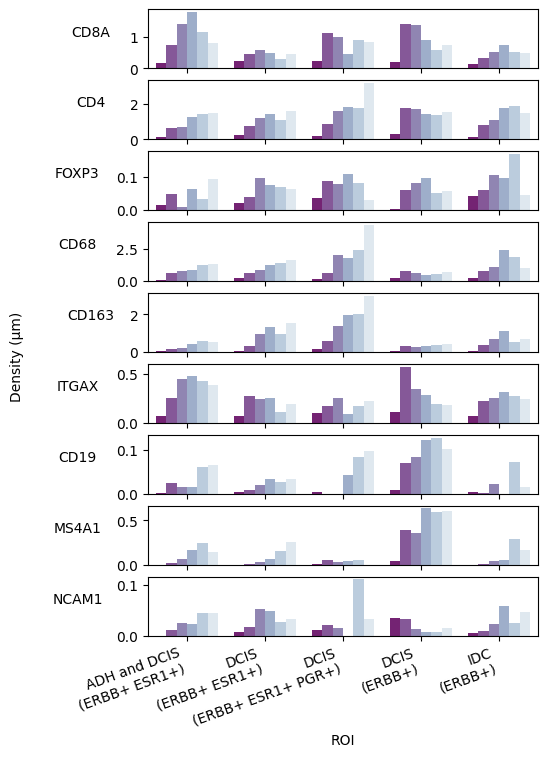

In [940]:
fig, axes = plt.subplots(
    nrows=len(gene_marker_ls), ncols=1, figsize=(6, 7)
)

for s, i in enumerate(gene_marker_ls):

    if s != 1:
        sns.barplot(
            hue=df_shortest_roi.groupby("Gene").get_group(i)["Region"].astype(str), 
            y=df_shortest_roi.groupby("Gene").get_group(i)["Density"], 
            x=df_shortest_roi.groupby("Gene").get_group(i)["ROI"], 
            palette="BuPu_r", ax=axes[s], #legend=False,
        )
        axes[s].axes.get_legend().set_visible(False)
    else:
        sns.barplot(
            hue=df_shortest_roi.groupby("Gene").get_group(i)["Region"].astype(str), 
            y=df_shortest_roi.groupby("Gene").get_group(i)["Density"], 
            x=df_shortest_roi.groupby("Gene").get_group(i)["ROI"], 
            palette="BuPu_r", ax=axes[s], #legend=True,
        )
        axes[s].axes.get_legend().set_visible(False)
    
    if s != len(gene_marker_ls) - 1:
        plt.setp(axes[s].get_xticklabels(), visible=False)

    else:
        plt.setp(axes[s].get_xticklabels(), visible=True)
        
    #axes[s].axes.xaxis.set_visible(False)
    axes[s].axes.set_ylabel(i, rotation=0, labelpad=28, fontsize=10)
    
#fig.supxlabel('ROI', fontsize=13)
fig.supylabel('Density (μm)', fontsize=10)
#fig.legend(loc='center left', bbox_to_anchor=(0.92, .5), frameon=False)
plt.subplots_adjust(hspace=0.2, left=0.25, top=0.995)
fig.autofmt_xdate(rotation=20, ha='right', bottom=0.1)
#plt.tight_layout()
plt.savefig(f"distance_subtype_breast.png", bbox_inches="tight", dpi=500)

## sk.pl.deg_manhattan_plot()

### Function

In [ ]:
from scipy import stats
from numpy import std, mean, sqrt
import plotly.graph_objects as go
import plotly
import pandas as pd
import seaborn as sns

#correct if the population S.D. is expected to be equal for the two groups.
def cohen_d(x,y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (mean(x) - mean(y)) / sqrt(((nx-1)*std(x, ddof=1) ** 2 + (ny-1)*std(y, ddof=1) ** 2) / dof)

def calculate_q(p_seq):
  p_arr   = np.asarray(p_seq)
  N       = len(p_arr)
  idx_arr = np.argsort(p_arr)
  q_arr   = p_arr[idx_arr] * N / (np.arange(N) + 1)
  q_arr   = np.minimum.accumulate(q_arr[::-1])[::-1]
  q_arr[idx_arr] = q_arr.copy()
  return q_arr

def deg_manhattan_plot(
    grid, 
    x_range=None, y_range=None, show=True, #min_grids=100
):
    '''
    grid: AnnData
    x_range, y_range: list
    std: bool
    min_grids: int
    '''

    # define variable which is name of table of gene expression by region--------------
    # if roi is selected
    if (x_range != None) | (y_range != None):
        name = "deg_by_region" \
        + "_x_["+", ".join([str(i) for i in x_range]) + "]" \
        + "_y_["+", ".join([str(i) for i in y_range]) + "]"
    else:
        name = "deg_by_region"

    # If it has already been calculated -----------------------------------------------
    if name in grid.uns.keys():
       df_q_res = grid.uns[name]
        
    else:
    
        ## Load shortest path and gene expression -------------------------------------
        df_shotest = grid.uns["shortest"]
        df_grid = grid.to_df()
        
        # complement nan grid
        df_grid = pd.merge(
            pd.DataFrame(index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)]), 
            df_grid, right_index=True, left_index=True, how="left"
        ).fillna(np.nan)
        
        df_region = pd.DataFrame(
            np.array(df_shotest["region"]).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
            index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["region"]
        )
    
        ## ROI selection -------------------------------------------------
        if (x_range != None) | (y_range != None):
            df_roi = pd.DataFrame(
                np.array(df_shotest.index).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
                index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["region"]
            )
            roi_grids = df_roi[df_roi["region"].isin(
                [i for i in df_roi.region if (x_range[0] <= i[0] <= x_range[1]) & (y_range[0] <= i[1] <= y_range[1])]
            )].index
            # extract ROI
            df_region = df_region.loc[roi_grids, :]
            df_grid = df_grid.loc[roi_grids, :]
    
        ## Merge shortest table and expression table --------------------------
        df_grid_region = pd.merge(
            df_grid, df_region, 
            right_index=True, left_index=True, how="left"
        )
        # region selection
        df_grid_region = df_grid_region.dropna()
        region_ls = df_region.region.value_counts()[df_region.region.value_counts() > 100].index # min grids
        
        # control is all
        df_control = df_grid_region.drop("region", axis=1)
        df_control = df_control.applymap(lambda x: np.log(x+1))
        gene_ls = df_grid.columns.tolist()

        # place holder
        p_res_ls = []
        # target is expression which is belong to each region 
        for i in region_ls:
            df_target = df_grid_region.groupby("region").get_group(i).drop("region", axis=1)
            df_target = df_target.applymap(lambda x: np.log(x+1))
            
            temp_p_res_ls = []        
            for s in gene_ls:
                A = df_target[s]
                B = df_control[s]
                # one sided test
                temp_p_res_ls += [stats.ttest_ind(A, B, equal_var = False, alternative="greater").pvalue]
        
            p_res_ls += [temp_p_res_ls]

        # dataframe
        df_p_res = pd.DataFrame(
            p_res_ls, 
            index=region_ls, 
            columns=gene_ls
        ).T

        # adjust
        df_q_res = pd.DataFrame(
            calculate_q(df_p_res.values.reshape(len(region_ls) * df_grid.shape[1])).reshape(df_grid.shape[1], len(region_ls)).T,
            index=region_ls, 
            columns=gene_ls
        ).T.fillna(1)

        
        df_q_res = df_q_res.apply(lambda x: np.log10(x) * -1)
        df_q_res = df_q_res.T.sort_index().T

        ## Save in uns----------------------------------------------------------------
        grid.uns[name] = df_q_res

    # Plot -----------------------------------------------------------------
    df_q_res_stack = pd.DataFrame(
        df_q_res.stack()
    ).reset_index()
    df_q_res_stack.columns = ["Gene", "Region", "-log(qvalue)"]
    df_q_res_stack.Region = df_q_res_stack.Region.astype(str)
    
    # ジッタープロットを作成
    fig = px.strip(df_q_res_stack, x='Region', y="-log(qvalue)", color="Gene", 
                  )
    
    # edit layouts
    fig.update_layout(
        title='Differential abundance gene of each region',
        yaxis_title='-log(qvalue)',
    )
    
    for i in range(-1, len(df_q_res_stack.Region.unique()) -1 ):
        fig.add_vrect(
            x0=0.5+i, x1=0.5+i, row="all", col=1, line_width=0.2
        )
    
    
    fig.update_xaxes(matches=None)
    fig.update_layout(plot_bgcolor="white")
    fig.update_layout(xaxis=dict(title=None))
    fig.for_each_xaxis(lambda xax: xax.update(title=None))

    fig.show()

### Test

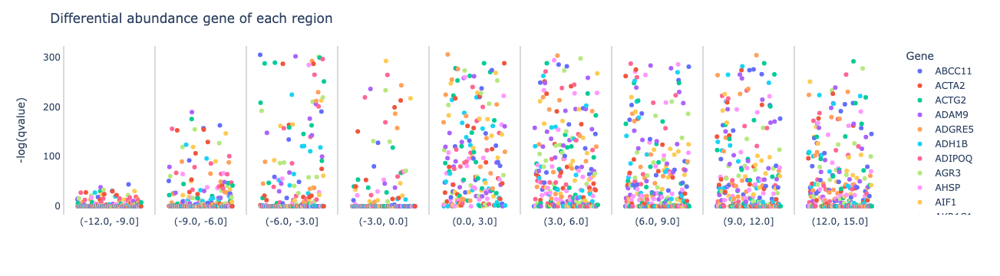

In [1145]:
deg_manhattan_plot(grid)

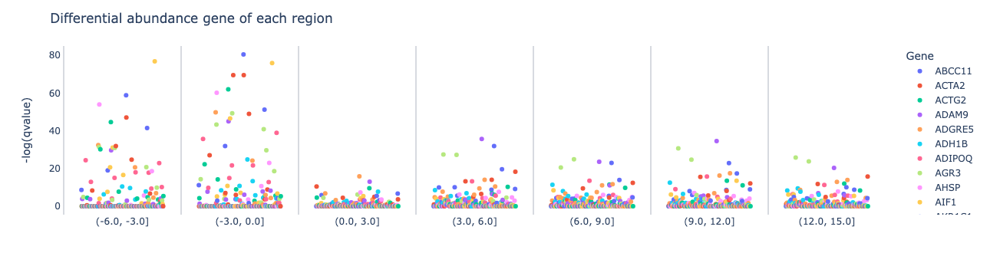

In [1172]:
deg_manhattan_plot(grid, x_range=[620, 700], y_range=[200, 280])

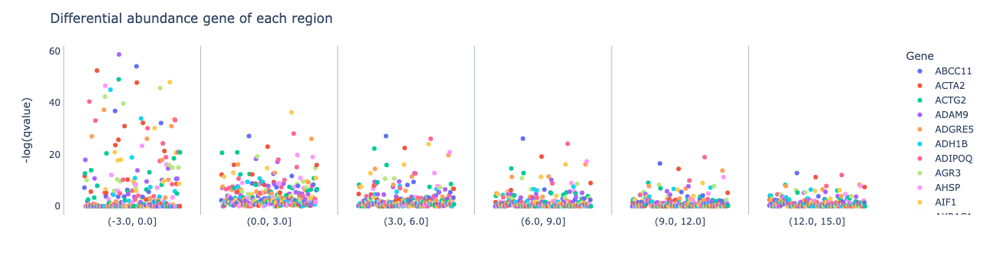

In [1171]:
deg_manhattan_plot(grid, x_range=[380, 460], y_range=[25, 105])

# Development

## Indivisual tumor-solid-based analysis

### Annotation of (−∞, 0] section of indivisual tumor-solid

In [878]:
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import cv2


In [952]:
def convert_indivisual_solid(grid):
    '''
    grid: AnnData after `distance_calculator`
    '''
    
    ## get col and row length data from grid object --------------------------
    N_ROW = len(grid.uns["grid_yedges"]) - 1
    N_COL = len(grid.uns["grid_xedges"]) - 1
    
    # show separation of indivisual tumor solid using rectangle -------------------------------------------
    # load contour image from skny object
    img_color = grid.uns["marker_delineation"].copy()
    img_gray = cv2.imread(img,cv2.IMREAD_GRAYSCALE)
    
    # extraction of indivisual tumor-solid from contoured image
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(img_gray)
    
    # delineation of indivisual tumor-solid using rectangle
    for i in range(1, retval):
        x, y, width, height, area = stats[i] # extract regtangle information
        if area > 10: # exclude area<100μm^2
            cv2.rectangle(img_color, (x, y), (x+width, y+height), (0, 0, 255), thickness=1)
            cv2.putText(img_color, f"{i}", (x, y), cv2.FONT_HERSHEY_PLAIN, 0.8, (0, 0, 255), 1, cv2.LINE_8)
    
    # Load region annotation dataframe
    df_shotest = grid.uns["shortest"]
    df_shotest["right"] = df_shotest["region"].apply(lambda x: x.right)
    
    # convert to dataframe
    df_solid = pd.DataFrame(
        labels.reshape(N_COL, N_ROW).reshape(N_ROW * N_COL), 
        index=df_shotest.index, columns=["solid"]
    )
    
    # merge to df_shortest
    df_shotest = pd.merge(
        df_shotest, df_solid, right_index=True, left_index=True, how="left"
    )
    
    # extract (−∞, 0] section from indivisual tumor solid ----------------------------------------
    solid_ls = []
    for i, s in zip(df_shotest["right"], df_shotest["solid"]):
        if (i > 0 ) & (s != 0 ): # select solid regeion and (−∞, 0] section 
            solid_ls += [0]
        else:
            solid_ls += [s]
    # add to dataframe
    df_shotest["solid"] = solid_ls
    
    
    # merge region annotations and gene expression data -----------------------------------
        # load gene expression of each grid 
    df_grid = grid.to_df()
    
    # complement nan grid
    df_grid = pd.merge(
        pd.DataFrame(index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)]), 
        df_grid, right_index=True, left_index=True, how="left"
    ).fillna(np.nan)
    # complement nan grid
    df_solid = pd.DataFrame(
        np.array(df_shotest["solid"]).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
        index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["solid"]
    )
    # merge
    df_grid_solid = pd.merge(
        df_grid, df_solid, 
        right_index=True, left_index=True, how="left"
    )
    
    # mean based on (−∞, 0] section of indivisual tumor solid
    df_solid = df_grid_solid.dropna().groupby("solid").mean()
    # exclude untargeted coodinates
    df_solid = df_solid[df_solid.index != 0]
    
    # generate annotation matrix of each tumor solid 
    df_solid_centroid = pd.DataFrame(
        centroids[df_solid.index], 
        index=[f"solid_{str(int(i))}" for i in df_solid.index], 
        columns=["imagecol", "imagerow"]
    )
    df_solid_centroid["solid"] = df_solid.index
    
    
    # create AnnData object of (−∞, 0] section of indivisual tumor solid ----------------------------
    counts = df_solid.values
    solid = ad.AnnData(counts, uns={"spatial": {"data": {
        'scalefactors': {'tissue_hires_scalef': 1, 'spot_diameter_fullres': 10}, 
        'use_quality': 'hires',
        'images': {'hires':np.array([[255, 255, 255, 255]])}
    }}})
    
    # add cell and gene name
    solid.obs_names = [f"solid_{str(int(i))}" for i in df_solid.index]
    solid.var_names = df_solid.columns.tolist()
    
    # add centroid to metadata
    solid.obs = df_solid_centroid
    
    # annotation processing image to AnnData object ------------------------------------
    solid.uns["indivisual_tumor_solid"] = img_color
    # annotation of dataframe
    solid.uns["shortest"] = df_shotest

    return solid

In [956]:
solid = convert_indivisual_solid(grid)

In [957]:
solid.layers["counts"] = solid.X.copy()
sc.pp.normalize_total(solid, inplace=True)
sc.pp.log1p(solid)
sc.pp.pca(solid)
sc.pp.neighbors(solid)
sc.tl.umap(solid)
sc.tl.leiden(solid)

/Users/sakai/miniconda3/envs/xenium/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



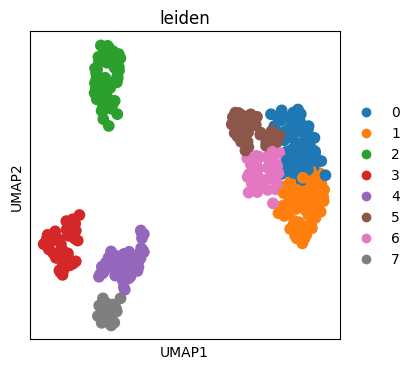

In [958]:
#with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": (300)}):

fig, ax = plt.subplots(figsize=(4, 4))

ax = sc.pl.umap(
    solid,
    color=[
        #"solid",
        "leiden",
    ],
    wspace=0.4,
    ax=ax, 
    save="breast_solid_umap.png", )

#plt.savefig("breast_solid_umap.png", dpi=500)

In [959]:
marker_genes_dict = {
    'Subtypes': ['ERBB2', 'ESR1', 'PGR', 'MKI67'], 
    "Tumor": ["FASN", "FOXA1", "CEACAM6", "MZB1", "AGR3", "SERPINA3", "ABCC11"]
}

categories: 0, 1, 2, etc.
var_group_labels: Subtypes, Tumor


/Users/sakai/miniconda3/envs/xenium/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



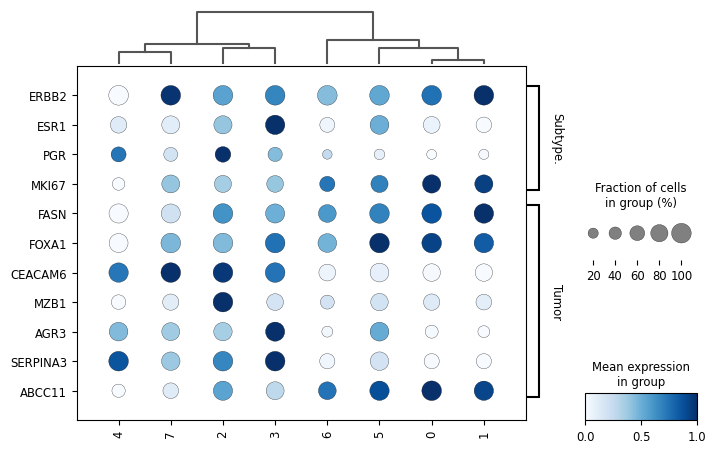

In [960]:
#with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": (300)}):
ax = sc.pl.dotplot(solid, marker_genes_dict, groupby='leiden', dendrogram=True, swap_axes=True,
                   standard_scale='var', smallest_dot=40, color_map='Blues', figsize=(8,5), save="breast_solid_clustering_marker.png")

In [961]:
# cluster annotation to df_shortest
df_shotest = pd.merge(
    df_shotest, 
    solid.obs.drop("solid", axis=1).reset_index()[["solid", "leiden"]], 
    on="solid", how="left"
)

KeyError: "['solid'] not in index"

In [962]:
solid.obs["leiden"].unique()

['3', '0', '7', '6', '1', '4', '2', '5']
Categories (8, object): ['0', '1', '2', '3', '4', '5', '6', '7']

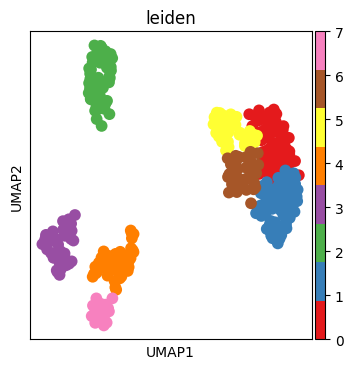

In [963]:
#with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": (300)}):
solid.obs["leiden"] = solid.obs["leiden"].astype(float)
fig, ax = plt.subplots(figsize=(4, 4))
cmap = matplotlib.cm.Set1
cmap.N = 8
#cmap.N = 7
ax = sc.pl.umap(
    solid,
    color=[
        #"solid",
        "leiden",
    ],
    wspace=0.4,
    ax=ax, 
    cmap=cmap,
    save="breast_solid_umap.png", )

In [964]:
# save figure
fig, ax = plt.subplots(figsize=(N_COL, N_ROW), dpi=1, tight_layout=True)

image = np.array(df_shotest["leiden"].astype(float).fillna(-1)).reshape(N_ROW, N_COL)

ax.imshow(
    image, cmap=cmap,
    vmin=0,
    vmax=9,
)
ax.axis('off')
plt.savefig("cluster.png")

KeyError: 'leiden'

Error in callback <function _draw_all_if_interactive at 0x7fded0a71310> (for post_execute):


RuntimeError: In set_size: Could not set the fontsize (invalid ppem value; error code 0x97)

RuntimeError: In set_size: Could not set the fontsize (invalid ppem value; error code 0x97)

<Figure size 752x547 with 1 Axes>

### Annotation of (0, +30] section of indivisual tumor-solid

In [847]:
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc


In [887]:
# show separation of indivisual tumor solid using rectangle -------------------------------------------
# load contour image from skny object
img_color = grid.uns["marker_delineation"].copy()
#img_gray = cv2.imread(img,cv2.IMREAD_GRAYSCALE)
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

# extraction of indivisual tumor-solid from contoured image
retval, labels, stats, centroids = cv2.connectedComponentsWithStats(img_gray)

# delineation of indivisual tumor-solid using rectangle
for i in range(1, retval):
    x, y, width, height, area = stats[i] # extract regtangle information
    if area > 10: # exclude area<100μm^2
        cv2.rectangle(img_color, (x - 3, y - 3), (x+width+3, y+height+3), (0, 0, 255), thickness=1)
cv2.imwrite("marker_delineation_n+3.png", img_color) # save

True

In [888]:
# take all-region-XOR based on all rectangle ---------------------------------
xor_result = None # place holder
for i in range(1, retval): # each rectangle
    x, y, width, height, area = stats[i] # extract regtangle information
    if area > 10: # exclude area<100μm^2
        image = np.zeros((N_ROW, N_COL), dtype=np.uint8) * 255 # generate zero matrix of same size
        cv2.rectangle(image, (x - 3, y - 3), (x+width+3, y+height+3), 255, thickness=-1) # delineate rectangle
        
        # rectangle is added to zero matrix
        if xor_result is None:
            xor_result = image
        else:
            xor_result = xor_result + image
        

# select coordinates where rectangle is unique
xor_result = np.where(xor_result != 255, 0, 255)
# convert datatype
xor_result = np.array(xor_result, dtype="uint8")

# save XOR image
cv2.imwrite("xor.png", xor_result)

True

In [889]:
# to attribute XOR region to indivisual tumor solid we take AND between all-region-XOR image and indivisual rectangle----------------
solid_peri = None # place holder
for i in range(1, retval): # each rectangle
    x, y, width, height, area = stats[i] # extract regtangle information
    if area > 10: # exclude area<100μm^2
        image = np.zeros((N_ROW, N_COL), dtype=np.uint8) * 255 # generate zero matrix of same size
        cv2.rectangle(image, (x - 3, y - 3), (x+width+3, y+height+3), 255, thickness=-1) # delineate rectangle
        and_result = cv2.bitwise_and(xor_result, image) # AND

        # white value (255) is converted to rectangle label, and these labels on coodinate added to zero matrix
        if solid_peri is None:
            solid_peri = (and_result / 255) * i
        else:
            solid_peri = solid_peri + ((and_result / 255) * i)

# convert to matrix to vector
solid_peri = solid_peri.reshape(N_COL, N_ROW).reshape(N_ROW * N_COL)

# dataframe
df_temp_solid = pd.DataFrame(
    solid_peri, 
    index=df_shotest.index, columns=["solid_peri"]
)

# Load region annotation dataframe
df_shotest = grid.uns["shortest"]
df_shotest["right"] = df_shotest["region"].apply(lambda x: x.right)
# merge to dataframe
df_shotest = pd.merge(
    df_shotest, df_temp_solid, right_index=True, left_index=True, how="left"
)

In [890]:
# extract (0, +30] section from XOR region of indivisual tumor solid ----------------------------------------
solid_peri_ls = [] # place holder
for i, s in zip(df_shotest["right"], df_shotest["solid_peri"]):
    if (i != 3 ) & (s != 0 ): # select XOR regeion and (0, +30] section 
        solid_peri_ls += [0]
    else:
        solid_peri_ls += [s]
# add to dataframe
df_shotest["solid_peri"] = solid_peri_ls

In [891]:
# merge region annotations and gene expression data -----------------------------------
# load gene expression of each grid 
df_grid = grid.to_df()

# complement nan grid
df_grid = pd.merge(
    pd.DataFrame(index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)]), 
    df_grid, right_index=True, left_index=True, how="left"
).fillna(np.nan)
# complement nan grid
df_solid = pd.DataFrame(
    np.array(df_shotest["solid_peri"]).reshape(N_ROW, N_COL).T.reshape(N_ROW * N_COL), 
    index=["grid_" + str(i+1) for i in range(N_ROW * N_COL)], columns=["solid_peri"]
)
# merge
df_grid_solid = pd.merge(
    df_grid, df_solid, 
    right_index=True, left_index=True, how="left"
)

# mean based on (0, +30] section of indivisual tumor solid
df_solid = df_grid_solid.dropna().groupby("solid_peri").mean()
# exclude untargeted coodinates
df_solid = df_solid[df_solid.index != 0]

# generate annotation matrix of each tumor solid 
df_solid_centroid = pd.DataFrame(
    centroids[[int(i) for i in df_solid.index]], 
    index=[int(i) for i in df_solid.index],
    columns=["imagecol", "imagerow"])
df_solid_centroid["solid_peri"] = df_solid_centroid.index


In [892]:
# create AnnData object of (0, +30] section of indivisual tumor solid ----------------------------
counts = df_solid.values
solid_peri = ad.AnnData(counts, uns={"spatial": {"data": {
    'scalefactors': {'tissue_hires_scalef': 1, 'spot_diameter_fullres': 10}, 
    'use_quality': 'hires',
    'images': {'hires':np.array([[255, 255, 255, 255]])}
}}})

# add cell and gene name
solid_peri.obs_names = df_solid.index.tolist()
solid_peri.var_names = df_solid.columns.tolist()

# add centroid to metadata
solid_peri.obs = df_solid_centroid

/Users/sakai/miniconda3/envs/xenium/lib/python3.8/site-packages/anndata/_core/anndata.py:864: UserWarning:


AnnData expects .obs.index to contain strings, but got values like:
    [2.0, 5.0, 7.0, 8.0, 17.0]

    Inferred to be: floating


/Users/sakai/miniconda3/envs/xenium/lib/python3.8/site-packages/anndata/_core/anndata.py:788: UserWarning:


AnnData expects .obs.index to contain strings, but got values like:
    [2, 5, 7, 8, 17]

    Inferred to be: integer




In [893]:
# annotation processing image to AnnData object ------------------------------------
solid_peri.uns["indivisual_tumor_solid"] = img_color
solid_peri.uns["xor_result"] = xor_result
# annotation of dataframe
solid_peri.uns["shortest"] = df_shotest

In [894]:
# Clustering -----------------------------------------------
solid_peri.layers["counts"] = solid_peri.X.copy()
sc.pp.normalize_total(solid_peri, inplace=True)
sc.pp.log1p(solid_peri)
sc.pp.pca(solid_peri)
sc.pp.neighbors(solid_peri)
sc.tl.umap(solid_peri)
sc.tl.leiden(solid_peri)

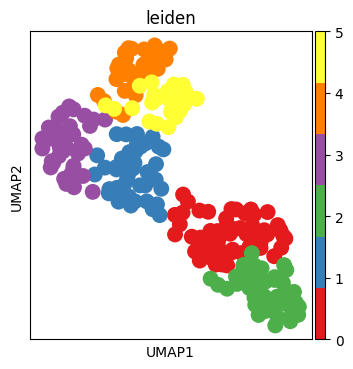

In [895]:
# show UMAP ---------------------------------------------------
#with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": (300)}):
solid_peri.obs["leiden"] = solid_peri.obs["leiden"].astype(float)
fig, ax = plt.subplots(figsize=(4, 4))
cmap = matplotlib.cm.Set1
cmap.N = len(solid_peri.obs["leiden"].unique())
ax = sc.pl.umap(
    solid_peri,
    color=[
        "leiden",
    ],
    wspace=0.4,
    ax=ax, 
    cmap=cmap,
    save="breast_solid_peri_umap.png", )

In [789]:
df_shotest = df_shotest.drop("leiden_peri", axis=1)

In [790]:
# cluster annotation to df_shortest
df_shotest = pd.merge(
    df_shotest, 
    solid.obs.drop("solid", axis=1).reset_index()[["solid", "leiden"]].rename(columns={"leiden": "leiden_peri"}), 
    on="solid", how="left")

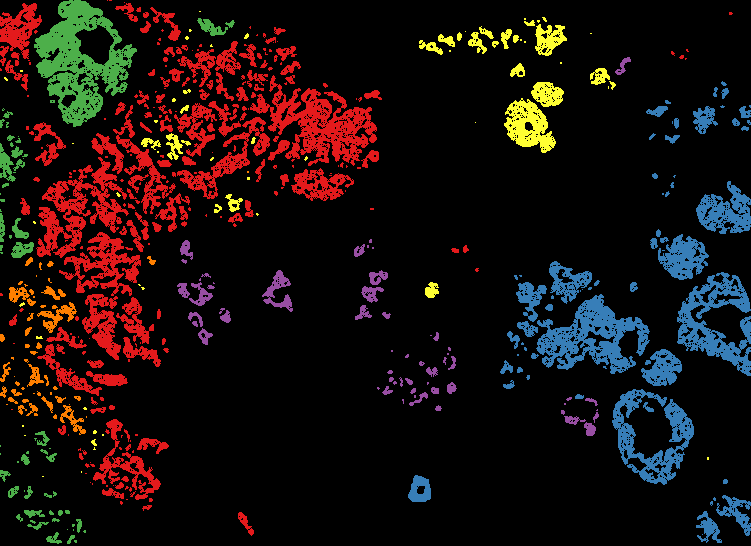

In [791]:
# save figure
fig, ax = plt.subplots(figsize=(N_COL, N_ROW), dpi=1, tight_layout=True)

image = np.array(df_shotest["leiden_peri"].astype(float).fillna(-1)).reshape(N_ROW, N_COL)

ax.imshow(
    image, cmap=cmap,
    vmin=0,
    vmax=7,
)
ax.axis('off')
plt.savefig("cluster_peri.png")